En este notebook se proporciona la metodología empleada para visualizar los puntos tridimensionales a un plano bidimensional, que posteriormente será proyectado a una imagen.

In [2]:
import os

import numpy as np
import cv2

import matplotlib.pyplot as plt
import plotly.express as px

from tqdm import tqdm
import glob
import struct

### Datos KITTI

In [3]:
directory = 'ruta'

In [ ]:
file_list = sorted(glob.glob(directory + '*.bin')) # Listado de archivos
file_list

In [4]:
def read_velodyne_bin(path):
    """
    Lee un archivo .bin y lo convierte en un array de numpy

    Args:
    path: path del archivo .bin

    Returns:
    points (np.ndarray): array de numpy con los puntos del archivo .bin (n, 4)
    """
    points = np.fromfile(path, dtype=np.float32).reshape(-1, 4)
    return points

In [59]:
points = [read_velodyne_bin(file) for file in file_list]

Para poder visualizar el conjunto de puntos velodyne como una imagen será necesario realizar una reestructuración de la proyección de los datos en los puntos tridimensionales a un plano 2D.

- Los datos de KITTI están en el siguiente formato [$x$, $y$, $z$ e intensidad(calor reflectante)]. Cada punto está representado como valores de 32 bits en punto flotante
- Para el proceso de aplanado hay que considerar 2 partes:
    - El ángulo radial corresponderá con la posición horizontal del punto en la imagen
    - El ángulo vertical corresponderá con la altura del punto en la imagen

    Esto se realizará mediante la transformación de las coordenadas cartesianas a coordenadas polares

- La intensidad de la imagen se representará por su grado de intensidad en la representación original


In [7]:
def extract_points(point_cloud):
    """
    Extrae las coordenadas x, y, z y la intensidad de un punto nube
    
    Args:
    point_cloud: Nube de puntos
    
    Returns:
    x: Coordenadas x
    y: Coordenadas y
    z: Coordenadas z
    intensity: Intensidad de cada punto
    """
    x = point_cloud[:, 0]
    y = point_cloud[:, 1]
    z = point_cloud[:, 2]
    intensity = point_cloud[:, 3]
    
    return x, y, z, intensity

## Conversión de coordenadas 3D a imagen

In [8]:
def lidar_to_depth_image(point_cloud, resolution=(600, 1500), h_fov=(-180, 180), v_fov=(-40, 15)):

    x, y, z, intensity = extract_points(point_cloud)  # Obtenemos los puntos x, y, z e intensidad


    h_angles = np.deg2rad(np.linspace(h_fov[0], h_fov[1], resolution[1]))  # calculamos el ángulo horizontal y vertical de cada punto
    # print(h_angles)
    v_angles = np.deg2rad(np.linspace(v_fov[1], v_fov[0], resolution[0]))
    

    depth_image = np.zeros(resolution)  # Se inicializa una matriz de ceros con la resolución buscada

    # Se calcula la proyección de los puntos en la imagen
    for i in range(len(x)):
        h_index = np.argmin(np.abs(h_angles - np.arctan2(y[i], x[i])))
        v_index = np.argmin(np.abs(v_angles - np.arctan2(z[i], np.sqrt(x[i]**2 + y[i]**2))))
        if 0 <= h_index < resolution[1] and 0 <= v_index < resolution[0]:
            depth_image[v_index, h_index] = intensity[i]
    return depth_image

depth_image = lidar_to_depth_image(points[0])
print(depth_image.shape)

plt.imshow(depth_image, cmap='gray')
plt.gcf().set_size_inches(20, 10)
plt.show()

(600, 1500)


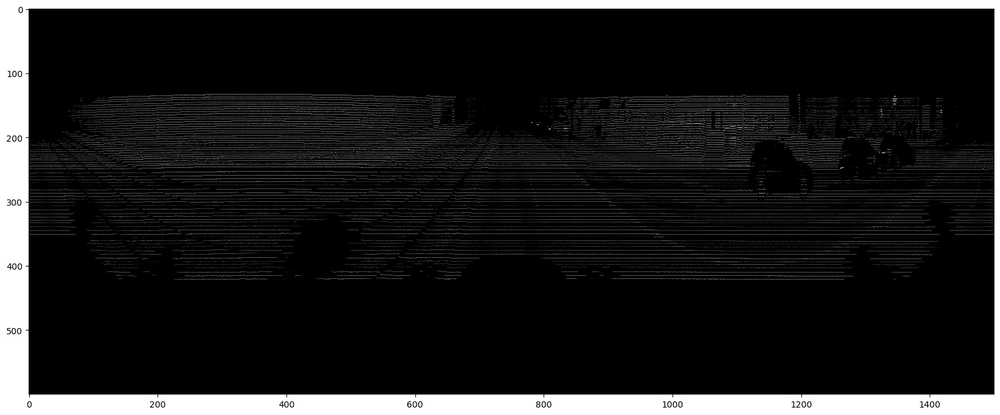

In [271]:
depth_image = lidar_to_depth_image(points[0])
print(depth_image.shape)

plt.imshow(depth_image, cmap='gray')
plt.gcf().set_size_inches(20, 10)
plt.show()


La visualización de los puntos diréctamente sobre la imagen no es muy nítida. Al estar trabajando directamente sobre la imagen cada punto representa un pixel. Esto no es deseable pues la resolución de los objetos es baja.

A continuación se proporciona una variación de la función, de forma que en vez de proyectar diréctamente los puntos en la imagen se realiza una conversión de los puntos tridimensionales a un plano bidimensional. Donde con la ayuda de librerías como matplotlib se puede conseguir una imagen más definida del entorno.

### Frontview projection

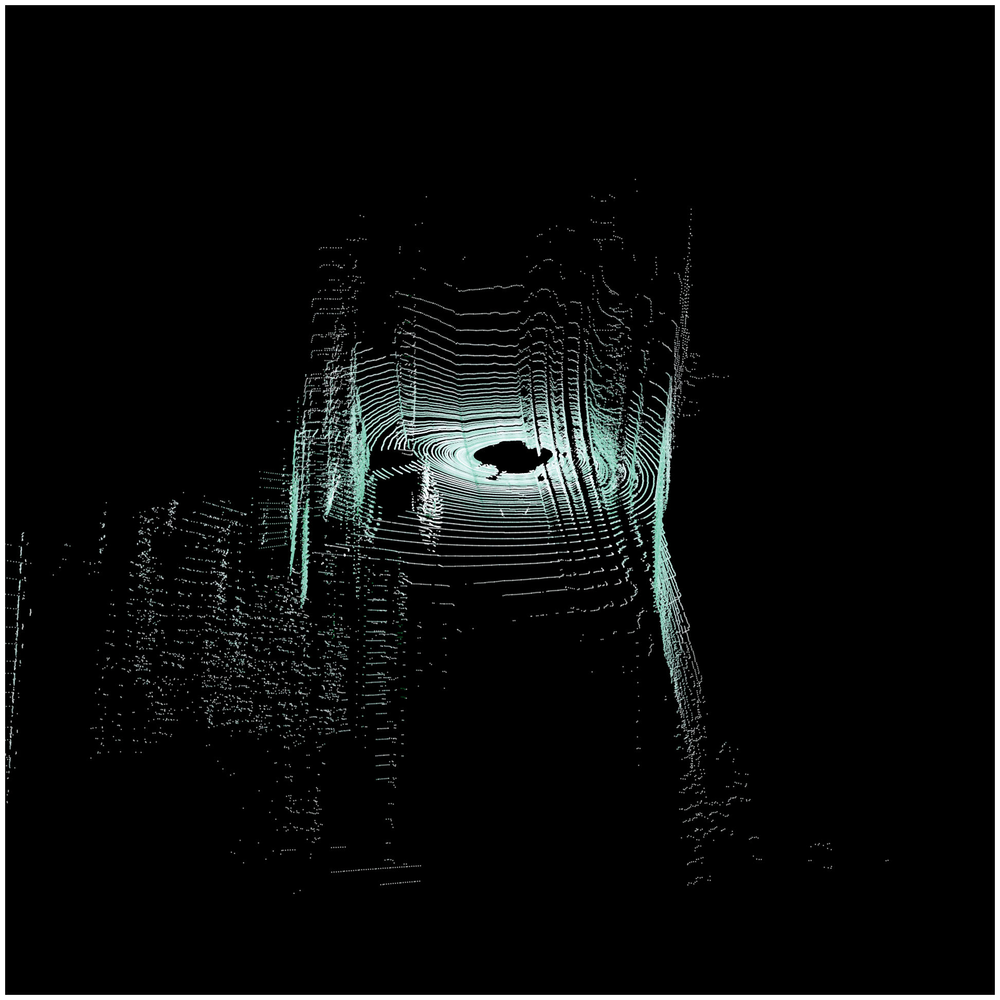

In [65]:
fig = plt.figure(figsize=(35, 25))
ax = fig.add_subplot(111, projection='3d')

angle = 175
ax.clear()
point = points[0]

ax.scatter(point[:, 0], point[:, 1], point[:, 2], c=point[:, 3], cmap='BuGn', s=1, alpha=0.5)
ax.set_facecolor('black')

ax.set_xlim(-40, 40)
ax.set_ylim(-30, 30)

ax.w_xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.grid(False)
ax.view_init(150, angle)

## Obtención de coordenadas en 3D a 2D

In [9]:
def lidar_to_depth_coordinates(point_cloud, resolution=(600, 1500), h_fov=(-180, 180), v_fov=(-40, 15)):
    """
    Convierte los datos de la nube de puntos LIDAR en coordenadas 2D con intensidad.
    
    Args:
    point_cloud (np.ndarray): Los datos de la nube de puntos LIDAR.
    resolution (tuple): La resolución deseada para la imagen de profundidad (alto, ancho).
    h_fov (tuple): El campo de visión horizontal (min_angle, max_angle) en grados.
    v_fov (tuple): El campo de visión vertical (min_angle, max_angle) en grados.
    
    Returns:
    coordinates_with_intensity (list): Lista de coordenadas 2D con intensidad de la nube de puntos.
    """
    
    # Obtenemos los puntos x, y, z e intensidad
    x, y, z, intensity = extract_points(point_cloud)

    # Calcula los ángulos horizontal y vertical para cada punto en la nube de puntos
    h_angle = np.arctan2(y, x)  # Angulo horizontal para cada punto
    v_angle = np.arctan2(z, np.sqrt(x**2 + y**2))  # Angulo vertical para cada punto

    # Convertimos los ángulos de FOV(Field Of View) de grados a radianes para los cálculos
    h_fov_rad = np.deg2rad(h_fov)
    v_fov_rad = np.deg2rad(v_fov)

    # Crea un array de ángulos para la imagen
    h_angles = np.linspace(h_fov_rad[0], h_fov_rad[1], resolution[1])
    v_angles = np.linspace(v_fov_rad[1], v_fov_rad[0], resolution[0])

    # Inicializa la lista de coordenadas
    coordinates_with_intensity = []

    # Encuentra los índices de los ángulos más cercanos en los arrays para cada punto
    for i in range(len(x)):
        # Indice horizontal en la imagen
        h_idx = np.argmin(np.abs(h_angles - h_angle[i]))
        # Indice vertical de la imagen
        v_idx = np.argmin(np.abs(v_angles - v_angle[i]))
        
        # Checkea si los indices están dentro de los límites de resolución especificados
        if 0 <= h_idx < resolution[1] and 0 <= v_idx < resolution[0]:
            # Añade las coordenadas y la intensidad a la lista
            coordinates_with_intensity.append((v_idx, h_idx, intensity[i]))

    return coordinates_with_intensity

In [10]:
def display_coordinates_as_image(coordinates_with_intensity):
    """
    Muestra las coordenadas 2D con intensidad como puntos usando matplotlib.
    
    Args:
    coordinates_with_intensity (list): Lista de coordenadas 2D con intensidad de la nube de puntos.
    resolution (tuple): La resolución de la imagen de profundidad (alto, ancho).
    """
    
    # Extrae los índices horizontales y verticales y las intensidades de las coordenadas
    v_indices = [coord[0] for coord in coordinates_with_intensity]
    h_indices = [coord[1] for coord in coordinates_with_intensity]
    intensities = [coord[2] for coord in coordinates_with_intensity]
    
    
    plt.figure(figsize=(11, 2))
    plt.scatter(h_indices, v_indices, c=intensities, cmap='viridis', s=1, alpha=0.2)
    plt.colorbar(label='Intensity')
    
    plt.gca().invert_yaxis()
    
    plt.gca().set_facecolor('black')
    plt.gcf().patch.set_facecolor('black')

    plt.gca().tick_params(colors='white')
    plt.gca().yaxis.label.set_color('white')
    plt.gca().xaxis.label.set_color('white')
    
    plt.show()

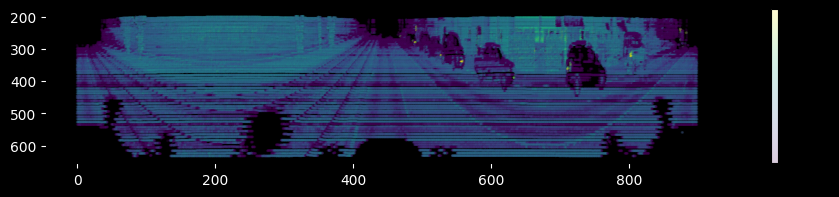

In [110]:
resolution = (900, 900)
coordinates_with_intensity = lidar_to_depth_coordinates(points[30], resolution)
display_coordinates_as_image(coordinates_with_intensity)

### Visualización de puntos interpolados (archivos obtenidos del notebook interpolation.ipynb)

In [12]:
directorio_puntos_interpolados = 'ruta de los puntos interpolados'
files_interpolados = sorted(glob.glob(directorio_puntos_interpolados + '/*.bin'))[100:]

puntos_interpolados = [read_velodyne_bin(file) for file in files_interpolados]

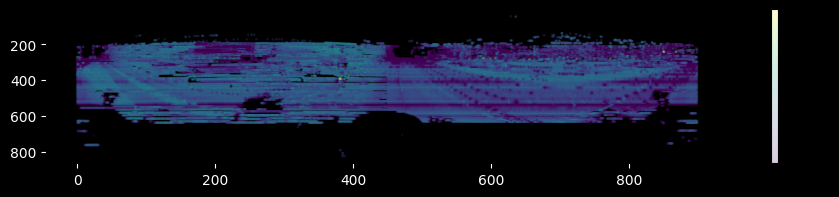

In [14]:
resolution = (900, 900)
coordinates_with_intensity = lidar_to_depth_coordinates(puntos_interpolados[30], resolution)
display_coordinates_as_image(coordinates_with_intensity)

## Datos ETSISI

In [7]:
directory = "ruta"
file_list = sorted(glob.glob(directory + '*.txt'))[:400] # Por limitaciones de memoria, solo se toman los primeros 400 archivos

In [8]:
def read_ouster_txt(path):
    """
    Lee un archivo .txt y lo convierte en un array de numpy

    Args:
    path: path del archivo .txt

    Returns:
    points (np.ndarray): array de numpy con los puntos del archivo .txt (n, 6)
    """
    points = np.loadtxt(path, dtype=np.float32).reshape(-1, 5)
    return points

In [9]:
points = [read_ouster_txt(file) for file in file_list]

In [12]:
fig = px.scatter_3d(x=points[0][:, 0], y=points[0][:, 1], z=points[0][:, 2], color=points[0][:, 4], color_continuous_scale='plasma',
                    title='Velodyne Points Visualization', labels={'x': 'X', 'y': 'Y', 'z': 'Z'})
fig.update_traces(marker=dict(size=1))
fig.update_layout(template='plotly_dark',
                paper_bgcolor='rgba(0,0,0,0)',
                scene=dict(
                    xaxis=dict(showgrid=False),
                    yaxis=dict(showgrid=False),
                    zaxis=dict(showgrid=False),
                    aspectmode='data'
                ))
fig.show()

In [36]:
points = [point[point[:, 0] != 0] for point in points]

In [58]:
def extract_ouster_points(point_cloud):
    """
    Extrae las coordenadas x, y, z y la intensidad de un punto nube
    
    Args:
    point_cloud: Nube de puntos
    
    Returns:
    x: Coordenadas x
    y: Coordenadas y
    z: Coordenadas z
    intensity: Intensidad de cada punto
    """
    x = point_cloud[:, 0]
    y = point_cloud[:, 1]
    z = point_cloud[:, 2]
    intensity = point_cloud[:, 3]
    reflectivity = point_cloud[:, 4]
    
    return x, y, z, intensity, reflectivity

In [130]:
def apply_tilt_correction(x, y, z, tilt_correction):
    """
    Aplica la corrección de inclinación a las coordenadas x, y, z de la nube de puntos.
    
    Args:
    x, y, z (np.ndarray): Las coordenadas x, y, z de la nube de puntos.
    tilt_correction (tuple): La corrección de inclinación en grados para los ejes X, Y, Z.
    
    Returns:
    x_rot, y_rot, z_rot (np.ndarray): Las coordenadas x, y, z rotadas.
    """
    angle_x, angle_y, angle_z = np.deg2rad(tilt_correction)

    # Rotación en el eje X
    Rx = np.array([
        [1, 0, 0],
        [0, np.cos(angle_x), -np.sin(angle_x)],
        [0, np.sin(angle_x), np.cos(angle_x)]
    ])
    
    # Rotación en el eje Y
    Ry = np.array([
        [np.cos(angle_y), 0, np.sin(angle_y)],
        [0, 1, 0],
        [-np.sin(angle_y), 0, np.cos(angle_y)]
    ])
    
    # Rotación en el eje Z	
    Rz = np.array([
        [np.cos(angle_z), -np.sin(angle_z), 0],
        [np.sin(angle_z), np.cos(angle_z), 0],
        [0, 0, 1]
    ])
    
    # Combinación de la rotación en los tres ejes
    R = Rz @ Ry @ Rx
    
    points = np.vstack((x, y, z))
    rotated_points = R @ points
    
    return rotated_points[0], rotated_points[1], rotated_points[2]

In [137]:
def lidar_to_depth_coordinates_ouster(point_cloud, resolution=(256, 1024), h_fov=(-180, 180), v_fov=(-22.5, 22.5), tilt_correction=(0, 0, 0)):
    """
    Convierte los datos de la nube de puntos LIDAR en coordenadas 2D con intensidad.
    
    Args:
    point_cloud (np.ndarray): Los datos de la nube de puntos LIDAR.
    resolution (tuple): La resolución deseada para la imagen de profundidad (alto, ancho).
    h_fov (tuple): El campo de visión horizontal (min_angle, max_angle) en grados.
    v_fov (tuple): El campo de visión vertical (min_angle, max_angle) en grados.
    tilt_correction (tuple): Corrección de rotación (ángulo_x, ángulo_y, ángulo_z) en grados.
    
    Returns:
    coordinates_with_intensity (list): Lista de coordenadas 2D con intensidad de la nube de puntos.
    """
    
    x, y, z, intensity, reflectivity = extract_ouster_points(point_cloud)   # Obtenemos los puntos [x, y, z, intensity, reflectivity]
    
    x, y, z = apply_tilt_correction(x, y, z, tilt_correction)    # Aplicamos la corrección de inclinación

    # Calcula los ángulos horizontal y vertical para cada punto en la nube de puntos
    h_angle = np.arctan2(x, y)  # Angulo horizontal para cada punto
    v_angle = np.arctan2(z, np.sqrt(x**2 + y**2))  # Angulo vertical para cada punto

    # Convertimos los ángulos de FOV(Field Of View) de grados a radianes para los cálculos
    h_fov_rad = np.deg2rad(h_fov)
    v_fov_rad = np.deg2rad(v_fov)

    # Crea un array de ángulos para la imagen
    h_angles = np.linspace(h_fov_rad[0], h_fov_rad[1], resolution[1])
    v_angles = np.linspace(v_fov_rad[1], v_fov_rad[0], resolution[0])

    # Inicializa la lista de coordenadas
    coordinates_with_intensity = []

    # Encuentra los índices de los ángulos más cercanos en los arrays para cada punto
    for i in range(len(x)):
        # Indice horizontal en la imagen
        h_idx = np.argmin(np.abs(h_angles - h_angle[i]))
        # Indice vertical de la imagen
        v_idx = np.argmin(np.abs(v_angles - v_angle[i]))
    
        
        # Checkea si los indices están dentro de los límites de resolución especificados
        if 0 <= h_idx < resolution[1] and 0 <= v_idx < resolution[0]:
            # Añade las coordenadas y la intensidad a la lista
            coordinates_with_intensity.append((v_idx, h_idx, reflectivity[i]))

    return coordinates_with_intensity

In [138]:
def filter_coordinates(coordinates_with_intensity, margin):
    """
    Filtra las coordenadas 2D con intensidad para cortar los lados superior, inferior, izquierdo y derecho de la imagen.
    
    Args:
    coordinates_with_intensity (list): Lista de coordenadas 2D con intensidad de la nube de puntos.
    margin (tuple): Márgenes a cortar (top, bottom, left, right).
    
    Returns:
    filtered_coordinates (list): Lista filtrada de coordenadas 2D con intensidad.
    """
    
    top_margin, bottom_margin, left_margin, right_margin = margin
    
    filtered_coordinates = [
        (v, h, intensity) for v, h, intensity in coordinates_with_intensity
        if top_margin <= v < 144 - bottom_margin and left_margin <= h < 640 - right_margin
    ]
    
    return filtered_coordinates

In [139]:
def display_coordinates_as_image(coordinates_with_intensity):
    """
    Muestra las coordenadas 2D con intensidad como puntos usando matplotlib.
    
    Args:
    coordinates_with_intensity (list): Lista de coordenadas 2D con intensidad de la nube de puntos.
    resolution (tuple): La resolución de la imagen de profundidad (alto, ancho).
    """
    
    # Extract the coordinates and intensity values
    v_indices = [coord[0] for coord in coordinates_with_intensity]
    h_indices = [coord[1] for coord in coordinates_with_intensity]
    intensities = [coord[2] for coord in coordinates_with_intensity]
    
    # Create the scatter plot
    plt.figure(figsize=(11, 2))
    plt.scatter(h_indices, v_indices, c=intensities, cmap='bone', s=1, alpha=1)
    # plt.colorbar(label='Intensity')
    
    # Invert y-axis to match the image coordinate system
    plt.gca().invert_yaxis()
    
    # Set the background color to black
    plt.gca().set_facecolor('black')
    plt.gcf().patch.set_facecolor('black')
    
    # Hide the axes
    plt.axis('off')
    
    plt.show()

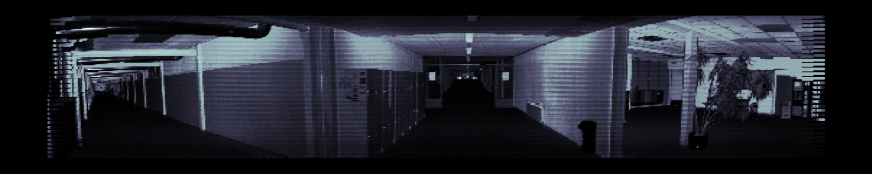

In [140]:
resolution = (256, 1024)
tilt_correction = (0, 0, -10)  
coordinates_with_intensity = lidar_to_depth_coordinates_ouster(point, resolution, tilt_correction=tilt_correction)

display_coordinates_as_image(coordinates_with_intensity)

In [141]:
directory = "directorio a los archivos .txt de ouster"
output_folder = "carpeta de salida"

Los datos de Ouster extraidos pueden tener un punto en la coordenada x=0, y=0, z=0. Este punto es ruido producido por el proceso de extracción cuyo impacto en el conjunto es menor, y no es apreciable en la visualización de la imagen.

En caso de querer procesar el conjunto para eliminar el punto se proprciona la siguiente función, su ejecución es opcional

In [142]:
file_list = sorted(glob.glob(directory + '/*.txt')) # Listado de todos los archivos .txt en el directorio
resolution = (256, 1024)

In [73]:
def process_batch(files):
    """
    Procesa batches de datos, filtra los puntos y guarda las coordenadas filtradas en un archivo .bin.
    El formato de datos es [z, y, x, intensidad/reflectividad]
    
    Args:
    files (list): Lista de archivos .bin a procesar.
    """
    for file in files:

        point_cloud = read_velodyne_bin(file)

        point_cloud = point_cloud[~((point_cloud[:, 2] == 0) & (point_cloud[:, 1] == 0))]   # elimina los puntos donde x e y son 0
        point_cloud = np.array(point_cloud)

        # Se guardan los puntos
        output_file = os.path.join(output_folder, os.path.basename(file))
        with open(output_file, 'wb') as f:
            for coord in point_cloud:
                z, y, x, intensity = coord[2], coord[1], coord[0], coord[3]
                f.write(struct.pack('ffff', z, y, x, intensity))


In [74]:
batch_size = 400
num_files = len(file_list)

for i in range(0, num_files, batch_size):
    batch_files = file_list[i:i + batch_size]
    process_batch(batch_files)